In [ ]:

!pip install -q diffusers transformers accelerate datasets pillow scikit-learn lpips


In [ ]:

import random, numpy as np
from tqdm.auto import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import warnings; warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from diffusers import DDIMScheduler, AutoencoderKL, UNet2DConditionModel
from transformers import CLIPTextModel, CLIPTokenizer, CLIPVisionModelWithProjection, CLIPImageProcessor
from datasets import load_dataset
from sklearn.model_selection import train_test_split

import lpips

random.seed(42); np.random.seed(42); torch.manual_seed(42); torch.cuda.manual_seed_all(42)
device = 'cuda'


In [ ]:

CONFIG = {
    # Dataset
    'n_samples': 500,
    'image_size': 256,
    'batch_size': 1,


    'lora_rank': 6,
    'ip_adapter_tokens': 4,
    'edit_scale': 1.2,
    'epochs': 8,
    'text_dropout': 0.3,
    'start_idx': 7,

    # Training
    'lr': 5e-5,
    'use_edit_mlp': True,

    # Keep proven optimizations
    'use_vae_mean': True,
    'use_text': True,
    'bias_timesteps': True,
    'inference_steps': 20,


    'duplicate_tokens': False,
    'noise_scale': 1.0,
    'unet_scale': 1.0,
}


In [ ]:

dataset = load_dataset("tarun-menta/re-edit-bench")
main_data = dataset['train'] if 'train' in dataset else dataset[list(dataset.keys())[0]]

n = min(CONFIG['n_samples'], len(main_data))
train_idx, val_idx = train_test_split(list(range(n)), test_size=0.2, random_state=42)
train_split = main_data.select(train_idx)
val_split = main_data.select(val_idx)

print(f"Train: {len(train_split)}, Val: {len(val_split)}")

Train: 400, Val: 100


In [ ]:

model_id = "runwayml/stable-diffusion-v1-5"

vae = AutoencoderKL.from_pretrained(model_id, subfolder="vae")
vae.eval().requires_grad_(False)

unet = UNet2DConditionModel.from_pretrained(model_id, subfolder="unet").to(device)
unet.enable_gradient_checkpointing()

text_encoder = CLIPTextModel.from_pretrained(model_id, subfolder="text_encoder")
text_encoder.eval().requires_grad_(False)
tokenizer = CLIPTokenizer.from_pretrained(model_id, subfolder="tokenizer")

clip_encoder = CLIPVisionModelWithProjection.from_pretrained("openai/clip-vit-large-patch14")
clip_encoder.eval().requires_grad_(False)

scheduler = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler")


lpips_model = lpips.LPIPS(net='alex').to(device)
lpips_model.eval()

torch.cuda.empty_cache()
print(f"All models loaded (GPU: {torch.cuda.memory_allocated(0)/1024**3:.2f} GB)")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
All models loaded (GPU: 9.80 GB)


In [ ]:
# Cell 6: LoRA (RANK 6)
class LoRALayer(nn.Module):
    def __init__(self, layer, rank=6, alpha=1.0):
        super().__init__()
        self.layer = layer
        self.rank, self.alpha = rank, alpha
        d = layer.weight.device
        self.lora_A = nn.Parameter(torch.randn(layer.in_features, rank, device=d)*0.01)
        self.lora_B = nn.Parameter(torch.zeros(rank, layer.out_features, device=d))
    def forward(self, x):
        return self.layer(x) + (x @ self.lora_A @ self.lora_B) * self.alpha

def inject_lora(unet, rank=6):
    count = 0
    for name, mod in unet.named_modules():
        if any(t in name for t in ['to_q','to_k','to_v','to_out.0']) and isinstance(mod, nn.Linear):
            parent = unet
            for p in name.split('.')[:-1]:
                if p: parent = getattr(parent, p)
            setattr(parent, name.split('.')[-1], LoRALayer(mod, rank))
            count += 1
    print(f"LoRA: {count} layers (rank={rank} - SWEET SPOT)")

def get_lora_params(unet):
    return [p for m in unet.modules() if isinstance(m, LoRALayer) for p in [m.lora_A, m.lora_B]]

In [ ]:

class IPAdapter(nn.Module):
    def __init__(self, num_tokens=4):
        super().__init__()
        self.num_tokens = num_tokens
        self.proj = nn.Linear(768, 768 * num_tokens)

    def forward(self, x):
        return self.proj(x).view(-1, self.num_tokens, 768)

class EditMLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(768, 768),
            nn.ReLU(),
            nn.Linear(768, 768)
        )

    def forward(self, x):
        return self.mlp(x)

def get_edit_emb(A, T, clip):
    proc = CLIPImageProcessor(do_rescale=False)
    A_p = proc(images=[(a.cpu().permute(1,2,0).numpy()+1)/2 for a in A], return_tensors="pt").pixel_values
    T_p = proc(images=[(t.cpu().permute(1,2,0).numpy()+1)/2 for t in T], return_tensors="pt").pixel_values
    with torch.no_grad():
        return clip(T_p).image_embeds - clip(A_p).image_embeds



In [ ]:

class DS(Dataset):
    def __init__(self, data, img_size=256):
        self.data = data
        self.t = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3,[0.5]*3)
        ])
    def __len__(self): return len(self.data)
    def __getitem__(self, i):
        s = self.data[i]
        return {
            'A': self.t(s['x_original'].convert('RGB')),
            'T': self.t(s['x_edited'].convert('RGB')),
            'p': s.get('caption','edit') or 'edit'
        }

train_loader = DataLoader(
    DS(train_split, img_size=CONFIG['image_size']),
    batch_size=CONFIG['batch_size'],
    shuffle=True,
    num_workers=0
)
print(f"DataLoader: {len(train_loader)} batches")

DataLoader: 400 batches


In [ ]:

inject_lora(unet, rank=CONFIG['lora_rank'])
unet.requires_grad_(False)
lora_params = get_lora_params(unet)
for p in lora_params: p.requires_grad = True

ip = IPAdapter(num_tokens=CONFIG['ip_adapter_tokens']).to(device)

if CONFIG['use_edit_mlp']:
    edit_mlp = EditMLP().to(device)
    trainable_params = lora_params + list(ip.parameters()) + list(edit_mlp.parameters())
else:
    edit_mlp = None
    trainable_params = lora_params + list(ip.parameters())

opt = torch.optim.AdamW(trainable_params, lr=CONFIG['lr'], weight_decay=1e-2)
scaler = torch.cuda.amp.GradScaler()

torch.cuda.empty_cache()
print(f"Ready (Trainable params: {sum(p.numel() for p in trainable_params):,})")
print(f"GPU: {torch.cuda.memory_allocated(0)/1024**3:.2f} GB")

LoRA: 128 layers (rank=6 - SWEET SPOT)
Ready (Trainable params: 4,739,328)
GPU: 9.82 GB


In [ ]:

def train(unet, ip, edit_mlp, loader, opt, scaler, vae, text_enc, tok, clip, scheduler, config, epochs=8):

    unet.train(); ip.train()
    if edit_mlp: edit_mlp.train()

    num_train_steps = scheduler.config.num_train_timesteps

    training_history = {
        'epoch_losses': [],      # List of lists - all batch losses per epoch
        'batch_losses': [],       # All batch losses across all epochs
        'epoch_avg_losses': []    # Average loss per epoch
    }

    for ep in range(epochs):
        epoch_losses = []
        pbar = tqdm(loader, desc=f"Epoch {ep+1}/{epochs}")

        for i, batch in enumerate(pbar):
            A, T, prompts = batch['A'].to(device), batch['T'].to(device), batch['p']
            opt.zero_grad()

            with torch.amp.autocast('cuda'):
                edit_emb = get_edit_emb(A, T, clip).to(device)
                if edit_mlp: edit_emb = edit_mlp(edit_emb)

                img_tok = ip(edit_emb) * config['edit_scale']

                if config['use_text']:
                    text_inp = tok(prompts, padding='max_length', max_length=77, truncation=True, return_tensors='pt')
                    txt_emb = text_enc(text_inp.input_ids)[0].to(device)
                    if random.random() < config['text_dropout']:
                        txt_emb = torch.zeros_like(txt_emb)
                else:
                    dummy = tok(["photo"] * len(prompts), padding='max_length', max_length=77, truncation=True, return_tensors='pt')
                    txt_emb = text_enc(dummy.input_ids)[0].to(device)

                enc = torch.cat([txt_emb, img_tok], 1)

                vae_gpu = vae.to(device)
                with torch.no_grad():
                    posterior = vae_gpu.encode(T).latent_dist
                    lat = posterior.mean * 0.18215 if config['use_vae_mean'] else posterior.sample() * 0.18215
                vae_gpu.cpu()
                torch.cuda.empty_cache()

                bsz = lat.shape[0]
                if config['bias_timesteps']:
                    low, high = int(0.2 * num_train_steps), int(0.8 * num_train_steps)
                    timesteps = torch.randint(low, high, (bsz,), device=device).long()
                else:
                    timesteps = torch.randint(0, num_train_steps, (bsz,), device=device).long()

                noise = torch.randn_like(lat)
                noisy_lat = scheduler.add_noise(lat, noise, timesteps)
                pred = unet(noisy_lat, timesteps, encoder_hidden_states=enc).sample
                loss = F.mse_loss(pred, noise)

            scaler.scale(loss).backward()
            scaler.unscale_(opt)
            torch.nn.utils.clip_grad_norm_(trainable_params, max_norm=1.0)
            scaler.step(opt)
            scaler.update()

            epoch_losses.append(loss.item())

            training_history['batch_losses'].append(loss.item())

            pbar.set_postfix({'loss': f"{loss.item():.4f}"})
            if i % 10 == 0: torch.cuda.empty_cache()

        epoch_avg = np.mean(epoch_losses)
        training_history['epoch_losses'].append(epoch_losses)
        training_history['epoch_avg_losses'].append(epoch_avg)

        print(f"Epoch {ep+1}/{epochs}: Loss={epoch_avg:.4f}\n")


        checkpoint_path = f'checkpoint_epoch_{ep+1}.pt'
        torch.save({
            'epoch': ep + 1,
            'unet_state_dict': unet.state_dict(),
            'ip_adapter_state_dict': ip.state_dict(),
            'edit_mlp_state_dict': edit_mlp.state_dict() if edit_mlp else None,
            'optimizer_state_dict': opt.state_dict(),
            'loss': epoch_avg,
            'config': config,
            'training_history': training_history
        }, checkpoint_path)
        print(f"Checkpoint saved: {checkpoint_path}")

    print(f"\n Total epochs: {epochs}")
    return unet, ip, edit_mlp, training_history



In [ ]:

torch.cuda.empty_cache()
unet, ip, edit_mlp, training_history = train(
    unet, ip, edit_mlp, train_loader, opt, scaler,
    vae, text_encoder, tokenizer, clip_encoder,
    scheduler, CONFIG, epochs=CONFIG['epochs']
)



final_model_path = 'lora_reedit_final_model.pt'
torch.save({
    'unet_state_dict': unet.state_dict(),
    'ip_adapter_state_dict': ip.state_dict(),
    'edit_mlp_state_dict': edit_mlp.state_dict() if edit_mlp else None,
    'config': CONFIG,
    'training_history': training_history
}, final_model_path)
print(f" Final model saved: {final_model_path}")

print("\n Extracting LoRA weights...")
lora_weights = {}
for name, param in unet.named_parameters():
    if 'lora' in name.lower():
        lora_weights[name] = param.data.cpu()

lora_weights_path = 'lora_weights_only.pt'
torch.save(lora_weights, lora_weights_path)
print(f"LoRA weights saved: {lora_weights_path}")
print(f"Total LoRA parameters: {len(lora_weights)}")

ip_adapter_path = 'ip_adapter_weights.pt'
torch.save(ip.state_dict(), ip_adapter_path)
print(f"IP-Adapter weights saved: {ip_adapter_path}")

if edit_mlp:
    edit_mlp_path = 'edit_mlp_weights.pt'
    torch.save(edit_mlp.state_dict(), edit_mlp_path)
    print(f"Edit MLP weights saved: {edit_mlp_path}")



Epoch 1/8:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 1/8: Loss=0.1289

Checkpoint saved: checkpoint_epoch_1.pt


Epoch 2/8:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 2/8: Loss=0.1165

Checkpoint saved: checkpoint_epoch_2.pt


Epoch 3/8:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 3/8: Loss=0.1206

Checkpoint saved: checkpoint_epoch_3.pt


Epoch 4/8:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 4/8: Loss=0.1216

Checkpoint saved: checkpoint_epoch_4.pt


Epoch 5/8:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 5/8: Loss=0.1176

Checkpoint saved: checkpoint_epoch_5.pt


Epoch 6/8:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 6/8: Loss=0.1250

Checkpoint saved: checkpoint_epoch_6.pt


Epoch 7/8:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 7/8: Loss=0.1193

Checkpoint saved: checkpoint_epoch_7.pt


Epoch 8/8:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 8/8: Loss=0.1235

Checkpoint saved: checkpoint_epoch_8.pt

 Total epochs: 8
 Final model saved: lora_reedit_final_model.pt

 Extracting LoRA weights...
LoRA weights saved: lora_weights_only.pt
Total LoRA parameters: 256
IP-Adapter weights saved: ip_adapter_weights.pt
Edit MLP weights saved: edit_mlp_weights.pt


Plotting
Total Epochs: 8
Total Batches: 3200
Batches per Epoch: 400

 Training curves saved to: ./training_plots/training_curves_comprehensive.png


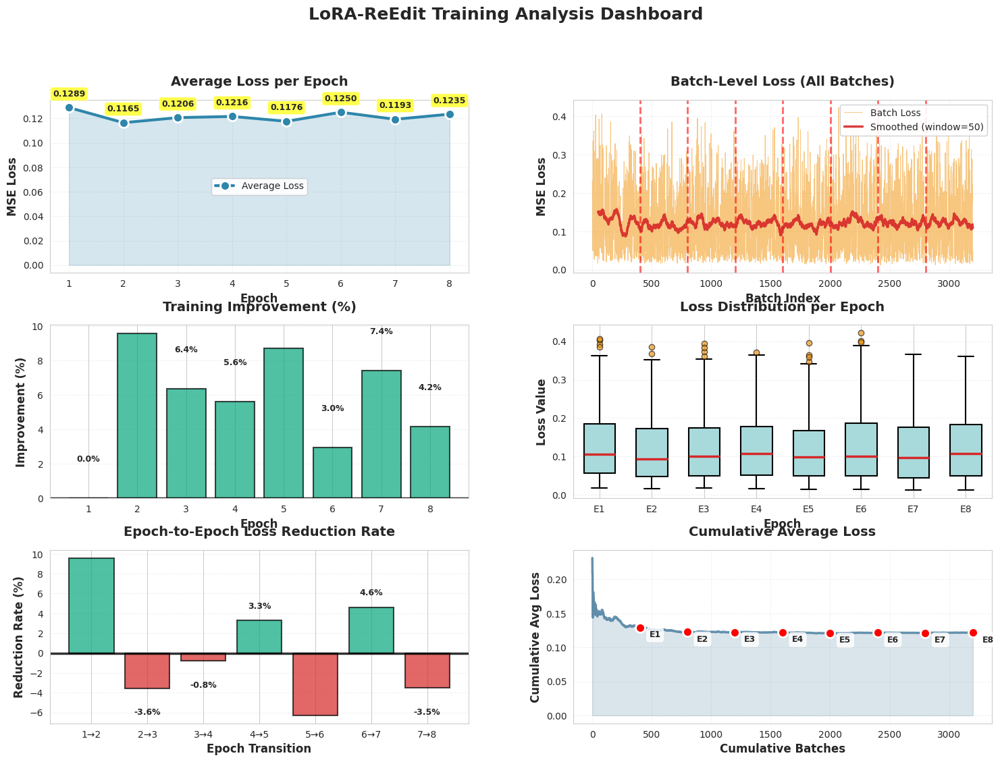

Summary
Initial Loss (Epoch 1): 0.128858
Final Loss (Epoch 8): 0.123469
Total Loss Reduction: 0.005388
Improvement Rate: 4.18%
Best Epoch: 2 (Loss: 0.116492)
Worst Epoch: 1 (Loss: 0.128858)
Average Loss (all epochs): 0.121627
Loss Std Dev: 0.003811


In [ ]:


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

def plot_training_curves(training_history, save_path='./training_plots'):

    os.makedirs(save_path, exist_ok=True)

    # Set style
    sns.set_style("whitegrid")

    # Create figure with subplots
    fig = plt.figure(figsize=(18, 12))
    gs = fig.add_gridspec(3, 2, hspace=0.3, wspace=0.25)

    # Extract data
    epoch_avg_losses = training_history['epoch_avg_losses']
    batch_losses = training_history['batch_losses']
    num_epochs = len(epoch_avg_losses)
    epochs = list(range(1, num_epochs + 1))


    print("Plotting")

    print(f"Total Epochs: {num_epochs}")
    print(f"Total Batches: {len(batch_losses)}")
    print(f"Batches per Epoch: {len(batch_losses) // num_epochs if num_epochs > 0 else 0}")

    # ========== PLOT 1: Epoch Average Loss ==========
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(epochs, epoch_avg_losses, linewidth=3, color='#2E86AB', marker='o',
             markersize=10, label='Average Loss', markeredgewidth=2, markeredgecolor='white')
    ax1.fill_between(epochs, epoch_avg_losses, alpha=0.2, color='#2E86AB')
    ax1.set_title('Average Loss per Epoch', fontsize=14, fontweight='bold', pad=15)
    ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
    ax1.set_ylabel('MSE Loss', fontsize=12, fontweight='bold')
    ax1.grid(True, alpha=0.3, linestyle='--', linewidth=0.7)
    ax1.legend(fontsize=10, framealpha=0.9)

    # Add value annotations on points
    for i, (e, loss) in enumerate(zip(epochs, epoch_avg_losses)):
        ax1.annotate(f'{loss:.4f}', (e, loss), textcoords="offset points",
                     xytext=(0,12), ha='center', fontsize=9, fontweight='bold',
                     bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))

    # ========== PLOT 2: All Batch Losses ==========
    ax2 = fig.add_subplot(gs[0, 1])
    batch_indices = list(range(len(batch_losses)))
    ax2.plot(batch_indices, batch_losses, linewidth=0.7, color='#F18F01', alpha=0.5, label='Batch Loss')

    # Add epoch boundaries
    batches_per_epoch = len(batch_losses) // num_epochs if num_epochs > 0 else len(batch_losses)
    for i in range(1, num_epochs):
        ax2.axvline(x=i * batches_per_epoch, color='red', linestyle='--', alpha=0.6, linewidth=2)

    # Add smoothed line
    if len(batch_losses) > 10:
        window = min(50, max(10, len(batch_losses) // 10))
        smoothed = np.convolve(batch_losses, np.ones(window)/window, mode='valid')
        smooth_indices = batch_indices[window-1:]
        ax2.plot(smooth_indices, smoothed, linewidth=2.5, color='#D62828',
                label=f'Smoothed (window={window})', alpha=0.9)

    ax2.set_title('Batch-Level Loss (All Batches)', fontsize=14, fontweight='bold', pad=15)
    ax2.set_xlabel('Batch Index', fontsize=12, fontweight='bold')
    ax2.set_ylabel('MSE Loss', fontsize=12, fontweight='bold')
    ax2.grid(True, alpha=0.3, linestyle='--', linewidth=0.7)
    ax2.legend(fontsize=10, framealpha=0.9)

    # ========== PLOT 3: Loss Improvement Over Time ==========
    ax3 = fig.add_subplot(gs[1, 0])
    if len(epoch_avg_losses) > 1:
        initial_loss = epoch_avg_losses[0]
        improvement = [(initial_loss - loss) / initial_loss * 100 for loss in epoch_avg_losses]

        colors = ['#06A77D' if imp >= 0 else '#D62828' for imp in improvement]
        bars = ax3.bar(epochs, improvement, color=colors, alpha=0.7, edgecolor='black', linewidth=1.5)
        ax3.axhline(y=0, color='black', linestyle='-', linewidth=2.5, alpha=0.8)

        ax3.set_title('Training Improvement (%)', fontsize=14, fontweight='bold', pad=15)
        ax3.set_xlabel('Epoch', fontsize=12, fontweight='bold')
        ax3.set_ylabel('Improvement (%)', fontsize=12, fontweight='bold')
        ax3.grid(True, alpha=0.3, linestyle='--', axis='y', linewidth=0.7)

        # Add value annotations on bars
        for bar, imp in zip(bars, improvement):
            height = bar.get_height()
            label_y = height + (2 if height >= 0 else -5)
            ax3.annotate(f'{imp:.1f}%', xy=(bar.get_x() + bar.get_width()/2, label_y),
                        ha='center', va='bottom' if height >= 0 else 'top',
                        fontsize=9, fontweight='bold')

    # ========== PLOT 4: Loss Distribution per Epoch ==========
    ax4 = fig.add_subplot(gs[1, 1])
    epoch_losses_list = training_history['epoch_losses']

    if len(epoch_losses_list) > 0:
        # Create box plot
        positions = list(range(1, len(epoch_losses_list) + 1))
        bp = ax4.boxplot(epoch_losses_list, positions=positions, widths=0.6,
                         patch_artist=True, showfliers=True,
                         boxprops=dict(facecolor='#A8DADC', edgecolor='black', linewidth=1.5),
                         whiskerprops=dict(color='black', linewidth=1.5),
                         capprops=dict(color='black', linewidth=1.5),
                         medianprops=dict(color='#D62828', linewidth=2.5),
                         flierprops=dict(marker='o', markerfacecolor='#F18F01', markersize=6, alpha=0.6))

        ax4.set_title('Loss Distribution per Epoch', fontsize=14, fontweight='bold', pad=15)
        ax4.set_xlabel('Epoch', fontsize=12, fontweight='bold')
        ax4.set_ylabel('Loss Value', fontsize=12, fontweight='bold')
        ax4.grid(True, alpha=0.3, linestyle='--', axis='y', linewidth=0.7)
        ax4.set_xticks(positions)
        ax4.set_xticklabels([f'E{i}' for i in positions])

    # ========== PLOT 5: Loss Reduction Rate ==========
    ax5 = fig.add_subplot(gs[2, 0])
    if len(epoch_avg_losses) > 1:
        loss_diff = [epoch_avg_losses[i] - epoch_avg_losses[i+1] for i in range(len(epoch_avg_losses)-1)]
        reduction_rate = [(diff / epoch_avg_losses[i]) * 100 for i, diff in enumerate(loss_diff)]

        epochs_diff = list(range(1, len(loss_diff) + 1))
        colors_rate = ['#06A77D' if rate > 0 else '#D62828' for rate in reduction_rate]

        bars = ax5.bar(epochs_diff, reduction_rate, color=colors_rate, alpha=0.7,
                      edgecolor='black', linewidth=1.5)
        ax5.axhline(y=0, color='black', linestyle='-', linewidth=2.5, alpha=0.8)

        ax5.set_title('Epoch-to-Epoch Loss Reduction Rate', fontsize=14, fontweight='bold', pad=15)
        ax5.set_xlabel('Epoch Transition', fontsize=12, fontweight='bold')
        ax5.set_ylabel('Reduction Rate (%)', fontsize=12, fontweight='bold')
        ax5.grid(True, alpha=0.3, linestyle='--', axis='y', linewidth=0.7)
        ax5.set_xticks(epochs_diff)
        ax5.set_xticklabels([f'{i}→{i+1}' for i in epochs_diff])

        # Add annotations
        for bar, rate in zip(bars, reduction_rate):
            height = bar.get_height()
            label_y = height + (1 if height >= 0 else -2)
            ax5.annotate(f'{rate:.1f}%', xy=(bar.get_x() + bar.get_width()/2, label_y),
                        ha='center', va='bottom' if height >= 0 else 'top',
                        fontsize=9, fontweight='bold')

    # ========== PLOT 6: Cumulative Loss Trend ==========
    ax6 = fig.add_subplot(gs[2, 1])
    cumulative_batches = list(range(1, len(batch_losses) + 1))
    cumulative_avg = [np.mean(batch_losses[:i+1]) for i in range(len(batch_losses))]

    ax6.plot(cumulative_batches, cumulative_avg, linewidth=2.5, color='#457B9D', alpha=0.8)
    ax6.fill_between(cumulative_batches, cumulative_avg, alpha=0.2, color='#457B9D')

    # Add epoch markers
    for i in range(1, num_epochs + 1):
        batch_idx = i * batches_per_epoch - 1
        if batch_idx < len(cumulative_avg):
            ax6.plot(batch_idx + 1, cumulative_avg[batch_idx], 'ro', markersize=10,
                    markeredgewidth=2, markeredgecolor='white')
            ax6.annotate(f'E{i}', xy=(batch_idx + 1, cumulative_avg[batch_idx]),
                        xytext=(10, -10), textcoords='offset points',
                        fontsize=9, fontweight='bold',
                        bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

    ax6.set_title('Cumulative Average Loss', fontsize=14, fontweight='bold', pad=15)
    ax6.set_xlabel('Cumulative Batches', fontsize=12, fontweight='bold')
    ax6.set_ylabel('Cumulative Avg Loss', fontsize=12, fontweight='bold')
    ax6.grid(True, alpha=0.3, linestyle='--', linewidth=0.7)

    # Overall title
    fig.suptitle('LoRA-ReEdit Training Analysis Dashboard',
                fontsize=18, fontweight='bold', y=0.995)

    # Save figure
    plot_file = os.path.join(save_path, 'training_curves_comprehensive.png')
    plt.savefig(plot_file, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"\n Training curves saved to: {plot_file}")

    plt.show()

    # Print summary statistics
    print("Summary")
    print(f"Initial Loss (Epoch 1): {epoch_avg_losses[0]:.6f}")
    print(f"Final Loss (Epoch {num_epochs}): {epoch_avg_losses[-1]:.6f}")
    print(f"Total Loss Reduction: {(epoch_avg_losses[0] - epoch_avg_losses[-1]):.6f}")
    print(f"Improvement Rate: {((epoch_avg_losses[0] - epoch_avg_losses[-1]) / epoch_avg_losses[0] * 100):.2f}%")
    print(f"Best Epoch: {np.argmin(epoch_avg_losses) + 1} (Loss: {np.min(epoch_avg_losses):.6f})")
    print(f"Worst Epoch: {np.argmax(epoch_avg_losses) + 1} (Loss: {np.max(epoch_avg_losses):.6f})")
    print(f"Average Loss (all epochs): {np.mean(epoch_avg_losses):.6f}")
    print(f"Loss Std Dev: {np.std(epoch_avg_losses):.6f}")

plot_training_curves(training_history)


In [ ]:

@torch.no_grad()
def compute_clip_score(img1, img2, clip_model):
    """Compute CLIP cosine similarity between two images"""
    proc = CLIPImageProcessor(do_rescale=False)

    if img1.dim() == 3:
        img1 = img1.unsqueeze(0)
    if img2.dim() == 3:
        img2 = img2.unsqueeze(0)

    img1_np = (img1.cpu().permute(0,2,3,1).numpy() + 1) / 2
    img2_np = (img2.cpu().permute(0,2,3,1).numpy() + 1) / 2

    img1_proc = proc(images=[img1_np[0]], return_tensors="pt").pixel_values
    img2_proc = proc(images=[img2_np[0]], return_tensors="pt").pixel_values

    emb1 = clip_model(img1_proc).image_embeds
    emb2 = clip_model(img2_proc).image_embeds

    score = F.cosine_similarity(emb1, emb2).item()
    return score

@torch.no_grad()
def compute_lpips(img1, img2, lpips_model):
    """Compute LPIPS perceptual distance (lower = more similar)"""
    if img1.dim() == 3:
        img1 = img1.unsqueeze(0)
    if img2.dim() == 3:
        img2 = img2.unsqueeze(0)

    score = lpips_model(img1.to(device), img2.to(device)).item()
    return score

def compute_l1(img1, img2):
    """Compute L1 pixel distance"""
    return F.l1_loss(img1, img2).item()


In [ ]:

@torch.no_grad()
def generate_edits(val_data, unet, ip, edit_mlp, vae, text_enc, tok, clip, sched, config, n=5):

    unet.eval(); ip.eval()
    if edit_mlp: edit_mlp.eval()

    vae_gpu = vae.to(device)
    transform = transforms.Compose([
        transforms.Resize((config['image_size'], config['image_size'])),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3),
    ])

    results = []
    for i in tqdm(range(min(n, len(val_data))), desc="Generating"):
        s = val_data[i]
        A = transform(s['x_original'].convert('RGB')).unsqueeze(0).to(device)
        T = transform(s['x_edited'].convert('RGB')).unsqueeze(0).to(device)
        y = transform(s['y_original'].convert('RGB')).unsqueeze(0).to(device)
        prompts = [s.get('caption', 'edit') or 'edit']

        edit_emb = get_edit_emb(A, T, clip).to(device)
        if edit_mlp: edit_emb = edit_mlp(edit_emb)

        # Method 1: Vanilla SD (text only)
        txt_inp = tok(prompts, padding='max_length', max_length=77, truncation=True, return_tensors='pt')
        txt_emb_only = text_enc(txt_inp.input_ids)[0].to(device)

        # Method 2: ReEdit (IP-Adapter, no LoRA)
        img_tok_no_lora = ip(edit_emb) * config['edit_scale']
        enc_no_lora = torch.cat([txt_emb_only, img_tok_no_lora], dim=1)

        # Method 3: LoRA-ReEdit (full)
        img_tok_full = ip(edit_emb) * config['edit_scale']
        enc_full = torch.cat([txt_emb_only, img_tok_full], dim=1)

        # Encode input
        posterior = vae_gpu.encode(y).latent_dist
        lat_init = posterior.mean * 0.18215 if config['use_vae_mean'] else posterior.sample() * 0.18215

        sched.set_timesteps(config['inference_steps'], device=device)
        noise = torch.randn_like(lat_init) * config['noise_scale']
        start_idx = config['start_idx']

        # Generate Method 1: Vanilla SD
        lat = sched.add_noise(lat_init.clone(), noise, sched.timesteps[start_idx])
        # Temporarily disable LoRA
        for m in unet.modules():
            if isinstance(m, LoRALayer):
                m.alpha = 0.0
        for timestep in sched.timesteps[start_idx:]:
            pred = unet(lat, timestep, encoder_hidden_states=txt_emb_only).sample
            lat = sched.step(pred, timestep, lat).prev_sample
        img_vanilla = vae_gpu.decode(lat / 0.18215).sample

        # Generate Method 2: ReEdit (no LoRA)
        lat = sched.add_noise(lat_init.clone(), noise, sched.timesteps[start_idx])
        for timestep in sched.timesteps[start_idx:]:
            pred = unet(lat, timestep, encoder_hidden_states=enc_no_lora).sample
            lat = sched.step(pred, timestep, lat).prev_sample
        img_no_lora = vae_gpu.decode(lat / 0.18215).sample

        # Generate Method 3: LoRA-ReEdit (full)
        # Re-enable LoRA
        for m in unet.modules():
            if isinstance(m, LoRALayer):
                m.alpha = 1.0
        lat = sched.add_noise(lat_init.clone(), noise, sched.timesteps[start_idx])
        for timestep in sched.timesteps[start_idx:]:
            pred = unet(lat, timestep, encoder_hidden_states=enc_full).sample
            lat = sched.step(pred, timestep, lat).prev_sample
        img_lora = vae_gpu.decode(lat / 0.18215).sample

        results.append({
            "y_orig": y[0].cpu(),
            "target": T[0].cpu(),
            "vanilla": ((img_vanilla[0] / 2 + 0.5).clamp(0, 1)).cpu(),
            "no_lora": ((img_no_lora[0] / 2 + 0.5).clamp(0, 1)).cpu(),
            "with_lora": ((img_lora[0] / 2 + 0.5).clamp(0, 1)).cpu(),
            "exemplar_before": A[0].cpu(),
            "exemplar_after": T[0].cpu()
        })
        torch.cuda.empty_cache()

    vae_gpu.cpu()
    print(f"\n Generated {len(results)} samples with 3 methods\n")
    return results


In [ ]:

results = generate_edits(
    val_split, unet, ip, edit_mlp, vae,
    text_encoder, tokenizer, clip_encoder,
    scheduler, CONFIG, n=5
)

Generating:   0%|          | 0/5 [00:00<?, ?it/s]


 Generated 5 samples with 3 methods



In [ ]:


metrics = {
    'vanilla': {'clip': [], 'lpips': [], 'l1': []},
    'no_lora': {'clip': [], 'lpips': [], 'l1': []},
    'with_lora': {'clip': [], 'lpips': [], 'l1': []}
}

for r in tqdm(results, desc="Computing metrics"):
    target = r['target']

    # Vanilla SD
    metrics['vanilla']['clip'].append(compute_clip_score(r['vanilla'], target, clip_encoder))
    metrics['vanilla']['lpips'].append(compute_lpips(r['vanilla'], target, lpips_model))
    metrics['vanilla']['l1'].append(compute_l1(r['vanilla'], target))

    # ReEdit (no LoRA)
    metrics['no_lora']['clip'].append(compute_clip_score(r['no_lora'], target, clip_encoder))
    metrics['no_lora']['lpips'].append(compute_lpips(r['no_lora'], target, lpips_model))
    metrics['no_lora']['l1'].append(compute_l1(r['no_lora'], target))

    # LoRA-ReEdit (full)
    metrics['with_lora']['clip'].append(compute_clip_score(r['with_lora'], target, clip_encoder))
    metrics['with_lora']['lpips'].append(compute_lpips(r['with_lora'], target, lpips_model))
    metrics['with_lora']['l1'].append(compute_l1(r['with_lora'], target))

# Compute averages
avg_metrics = {}
for method in ['vanilla', 'no_lora', 'with_lora']:
    avg_metrics[method] = {
        'clip': np.mean(metrics[method]['clip']),
        'lpips': np.mean(metrics[method]['lpips']),
        'l1': np.mean(metrics[method]['l1'])
    }


print(" QUANTITATIVE RESULTS")

print(f"\n{'Method':<20} {'CLIP↑':<12} {'LPIPS↓':<12} {'L1↓':<12}")

print(f"{'Vanilla SD':<20} {avg_metrics['vanilla']['clip']:.4f}       {avg_metrics['vanilla']['lpips']:.4f}       {avg_metrics['vanilla']['l1']:.4f}")
print(f"{'ReEdit (no LoRA)':<20} {avg_metrics['no_lora']['clip']:.4f}       {avg_metrics['no_lora']['lpips']:.4f}       {avg_metrics['no_lora']['l1']:.4f}")
print(f"{'LoRA-ReEdit':<20} {avg_metrics['with_lora']['clip']:.4f}       {avg_metrics['with_lora']['lpips']:.4f}       {avg_metrics['with_lora']['l1']:.4f}")


# Improvement percentages
clip_improve = ((avg_metrics['with_lora']['clip'] - avg_metrics['no_lora']['clip']) / avg_metrics['no_lora']['clip'] * 100)
lpips_improve = ((avg_metrics['no_lora']['lpips'] - avg_metrics['with_lora']['lpips']) / avg_metrics['no_lora']['lpips'] * 100)
l1_improve = ((avg_metrics['no_lora']['l1'] - avg_metrics['with_lora']['l1']) / avg_metrics['no_lora']['l1'] * 100)

print(f"\n LoRA-ReEdit vs ReEdit Improvements:")
print(f"  CLIP Score: {'+' if clip_improve > 0 else ''}{clip_improve:.1f}%")
print(f"  LPIPS: {'+' if lpips_improve > 0 else ''}{lpips_improve:.1f}% (lower is better)")
print(f"  L1 Loss: {'+' if l1_improve > 0 else ''}{l1_improve:.1f}% (lower is better)")


Computing metrics:   0%|          | 0/5 [00:00<?, ?it/s]

 QUANTITATIVE RESULTS

Method               CLIP↑        LPIPS↓       L1↓         
Vanilla SD           0.5892       0.7463       0.7403
ReEdit (no LoRA)     0.5935       0.7426       0.7400
LoRA-ReEdit          0.6946       0.6773       0.7168

 LoRA-ReEdit vs ReEdit Improvements:
  CLIP Score: +17.0%
  LPIPS: +8.8% (lower is better)
  L1 Loss: +3.1% (lower is better)


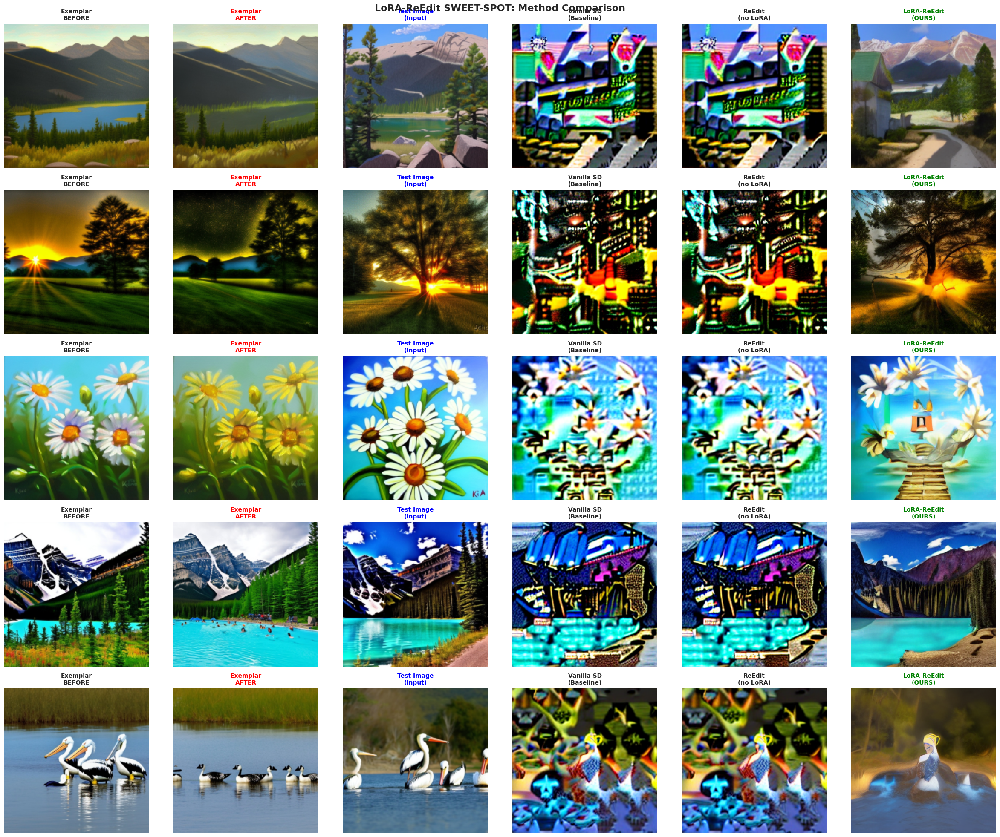

In [ ]:

def visualize_comparison(results, num_samples=5):
    n = min(num_samples, len(results))
    fig, axes = plt.subplots(n, 6, figsize=(24, 4*n))
    if n == 1:
        axes = axes.reshape(1, -1)

    for i, r in enumerate(results[:n]):
        # Exemplar: Before
        axes[i,0].imshow(np.clip((r['exemplar_before'].permute(1,2,0).numpy()+1)/2, 0, 1))
        axes[i,0].set_title('Exemplar\nBEFORE', fontsize=10, fontweight='bold')
        axes[i,0].axis('off')

        # Exemplar: After
        axes[i,1].imshow(np.clip((r['exemplar_after'].permute(1,2,0).numpy()+1)/2, 0, 1))
        axes[i,1].set_title('Exemplar\nAFTER', fontsize=10, fontweight='bold', color='red')
        axes[i,1].axis('off')

        # Test: Original
        axes[i,2].imshow(np.clip((r['y_orig'].permute(1,2,0).numpy()+1)/2, 0, 1))
        axes[i,2].set_title('Test Image\n(Input)', fontsize=10, fontweight='bold', color='blue')
        axes[i,2].axis('off')

        # Method 1: Vanilla SD
        axes[i,3].imshow(r['vanilla'].permute(1,2,0).numpy())
        axes[i,3].set_title('Vanilla SD\n(Baseline)', fontsize=10, fontweight='bold')
        axes[i,3].axis('off')

        # Method 2: ReEdit (no LoRA)
        axes[i,4].imshow(r['no_lora'].permute(1,2,0).numpy())
        axes[i,4].set_title('ReEdit\n(no LoRA)', fontsize=10, fontweight='bold')
        axes[i,4].axis('off')

        # Method 3: LoRA-ReEdit
        axes[i,5].imshow(r['with_lora'].permute(1,2,0).numpy())
        axes[i,5].set_title('LoRA-ReEdit\n(OURS)', fontsize=10, fontweight='bold', color='green')
        axes[i,5].axis('off')

    plt.suptitle('LoRA-ReEdit SWEET-SPOT: Method Comparison', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

visualize_comparison(results, num_samples=5)



In [ ]:

import pandas as pd

summary_df = pd.DataFrame({
    'Method': ['Vanilla SD', 'ReEdit (no LoRA)', 'LoRA-ReEdit'],
    'CLIP Score ↑': [
        f"{avg_metrics['vanilla']['clip']:.4f}",
        f"{avg_metrics['no_lora']['clip']:.4f}",
        f"{avg_metrics['with_lora']['clip']:.4f}"
    ],
    'LPIPS ↓': [
        f"{avg_metrics['vanilla']['lpips']:.4f}",
        f"{avg_metrics['no_lora']['lpips']:.4f}",
        f"{avg_metrics['with_lora']['lpips']:.4f}"
    ],
    'L1 Loss ↓': [
        f"{avg_metrics['vanilla']['l1']:.4f}",
        f"{avg_metrics['no_lora']['l1']:.4f}",
        f"{avg_metrics['with_lora']['l1']:.4f}"
    ]
})

print("\n FINAL RESULTS TABLE")

print(summary_df.to_string(index=False))



 FINAL RESULTS TABLE
          Method CLIP Score ↑ LPIPS ↓ L1 Loss ↓
      Vanilla SD       0.5892  0.7463    0.7403
ReEdit (no LoRA)       0.5935  0.7426    0.7400
     LoRA-ReEdit       0.6946  0.6773    0.7168


LoRA: 128 layers
Checkpoint keys: ['unet_state_dict', 'ip_adapter_state_dict', 'edit_mlp_state_dict', 'config', 'training_history']
UNet (with LoRA) loaded
IP-Adapter loaded
EditMLP loaded
All weights loaded, LoRA enabled
Validation set: 100 samples
Denoising with LoRA-ReEdit...


Steps:   0%|          | 0/13 [00:00<?, ?it/s]

Saved: inference_final/sample_0_complete.png


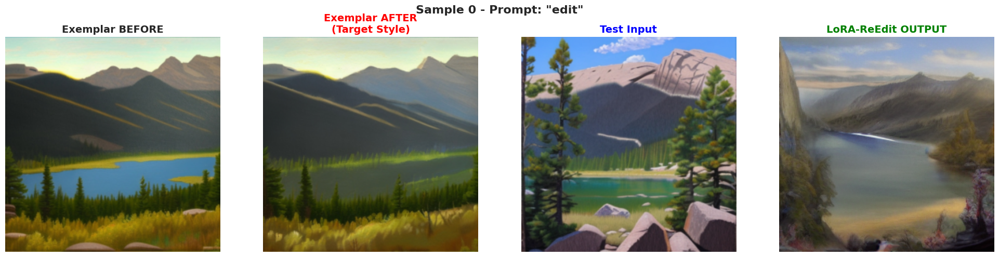

Denoising with LoRA-ReEdit...


Steps:   0%|          | 0/13 [00:00<?, ?it/s]

Saved: inference_final/sample_1_complete.png


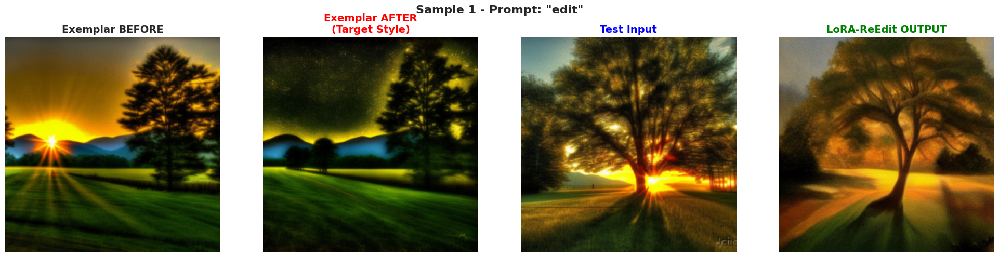

Denoising with LoRA-ReEdit...


Steps:   0%|          | 0/13 [00:00<?, ?it/s]

Saved: inference_final/sample_2_complete.png


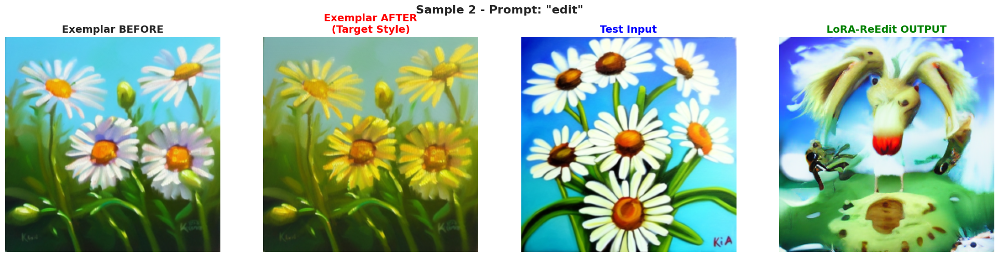

Denoising with LoRA-ReEdit...


Steps:   0%|          | 0/13 [00:00<?, ?it/s]

Saved: inference_final/sample_3_complete.png


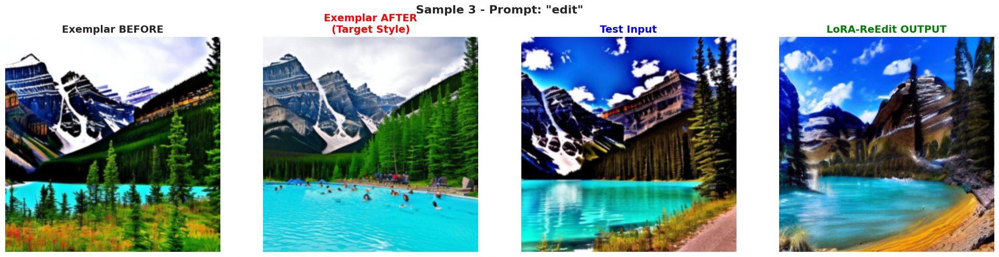

Denoising with LoRA-ReEdit...


Steps:   0%|          | 0/13 [00:00<?, ?it/s]

Saved: inference_final/sample_4_complete.png


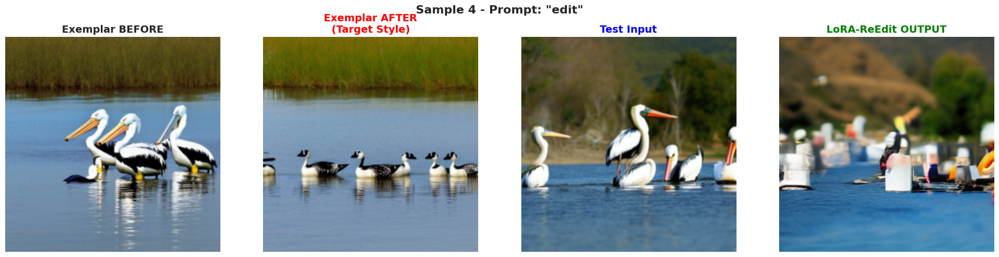


 All inference complete!


In [65]:

import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm.auto import tqdm
from diffusers import DDIMScheduler, AutoencoderKL, UNet2DConditionModel
from transformers import CLIPTextModel, CLIPTokenizer, CLIPVisionModelWithProjection, CLIPImageProcessor
from datasets import load_dataset
from sklearn.model_selection import train_test_split
import os

device = 'cuda'
torch.manual_seed(42)

CONFIG = {
    'n_samples': 500,
    'image_size': 256,
    'lora_rank': 6,
    'ip_adapter_tokens': 4,
    'edit_scale': 1.2,
    'start_idx': 7,
    'use_vae_mean': True,
    'inference_steps': 20,
    'noise_scale': 1.0,
}


model_id = "runwayml/stable-diffusion-v1-5"

vae = AutoencoderKL.from_pretrained(model_id, subfolder="vae")
vae.eval().requires_grad_(False)

unet = UNet2DConditionModel.from_pretrained(model_id, subfolder="unet").to(device)

text_encoder = CLIPTextModel.from_pretrained(model_id, subfolder="text_encoder").to(device)
text_encoder.eval().requires_grad_(False)
tokenizer = CLIPTokenizer.from_pretrained(model_id, subfolder="tokenizer")

clip_encoder = CLIPVisionModelWithProjection.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_encoder.eval().requires_grad_(False)

scheduler = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler")



# Define architectures
class LoRALayer(nn.Module):
    def __init__(self, layer, rank=6, alpha=1.0):
        super().__init__()
        self.layer = layer
        self.rank, self.alpha = rank, alpha
        d = layer.weight.device
        self.lora_A = nn.Parameter(torch.randn(layer.in_features, rank, device=d)*0.01)
        self.lora_B = nn.Parameter(torch.zeros(rank, layer.out_features, device=d))
    def forward(self, x):
        return self.layer(x) + (x @ self.lora_A @ self.lora_B) * self.alpha

class IPAdapter(nn.Module):
    def __init__(self, num_tokens=4):
        super().__init__()
        self.num_tokens = num_tokens
        self.proj = nn.Linear(768, 768 * num_tokens)
    def forward(self, x):
        return self.proj(x).view(-1, self.num_tokens, 768)

class EditMLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.mlp = nn.Sequential(nn.Linear(768, 768), nn.ReLU(), nn.Linear(768, 768))
    def forward(self, x):
        return self.mlp(x)

def get_edit_emb(A, T, clip):
    proc = CLIPImageProcessor(do_rescale=False)
    A_p = proc(images=[(a.cpu().permute(1,2,0).numpy()+1)/2 for a in A], return_tensors="pt").pixel_values
    T_p = proc(images=[(t.cpu().permute(1,2,0).numpy()+1)/2 for t in T], return_tensors="pt").pixel_values
    with torch.no_grad():
        return clip(T_p.to(device)).image_embeds - clip(A_p.to(device)).image_embeds

def inject_lora(unet, rank=6):
    count = 0
    for name, mod in unet.named_modules():
        if any(t in name for t in ['to_q','to_k','to_v','to_out.0']) and isinstance(mod, nn.Linear):
            parent = unet
            for p in name.split('.')[:-1]:
                if p: parent = getattr(parent, p)
            setattr(parent, name.split('.')[-1], LoRALayer(mod, rank))
            count += 1
    print(f"LoRA: {count} layers")

# Inject LoRA
inject_lora(unet, CONFIG['lora_rank'])

ip = IPAdapter(CONFIG['ip_adapter_tokens']).to(device)
edit_mlp = EditMLP().to(device)


checkpoint_path = "/content/drive/MyDrive/Gen_AI/lora_reedit_final_model.pt"

checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

print("Checkpoint keys:", list(checkpoint.keys()))

# Load with correct key names from training code
if 'unet_state_dict' in checkpoint:
    unet.load_state_dict(checkpoint['unet_state_dict'], strict=False)
    print("UNet (with LoRA) loaded")

if 'ip_adapter_state_dict' in checkpoint:
    ip.load_state_dict(checkpoint['ip_adapter_state_dict'])
    print("IP-Adapter loaded")

if 'edit_mlp_state_dict' in checkpoint and checkpoint['edit_mlp_state_dict'] is not None:
    edit_mlp.load_state_dict(checkpoint['edit_mlp_state_dict'])
    print("EditMLP loaded")

# Set to eval mode and enable LoRA
unet.eval()
ip.eval()
edit_mlp.eval()

# Enable LoRA
for m in unet.modules():
    if isinstance(m, LoRALayer):
        m.alpha = 1.0

print("All weights loaded, LoRA enabled")

# Load dataset
dataset = load_dataset("tarun-menta/re-edit-bench")
main_data = dataset['train'] if 'train' in dataset else dataset[list(dataset.keys())[0]]
n = min(CONFIG['n_samples'], len(main_data))
train_idx, val_idx = train_test_split(list(range(n)), test_size=0.2, random_state=42)
val_split = main_data.select(val_idx)
print(f"Validation set: {len(val_split)} samples")


def generate_edit(idx, save_dir="inference_final"):
    os.makedirs(save_dir, exist_ok=True)

    transform = transforms.Compose([
        transforms.Resize((CONFIG['image_size'], CONFIG['image_size'])),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3),
    ])

    s = val_split[idx]
    A = transform(s['x_original'].convert('RGB')).unsqueeze(0).to(device)
    T = transform(s['x_edited'].convert('RGB')).unsqueeze(0).to(device)
    y = transform(s['y_original'].convert('RGB')).unsqueeze(0).to(device)
    prompts = [s.get('caption', 'edit') or 'edit']



    vae_gpu = vae.to(device)

    with torch.no_grad():
        # Get edit embedding from exemplar pair
        edit_emb = get_edit_emb(A, T, clip_encoder).to(device)
        edit_emb = edit_mlp(edit_emb)

        # Get text embedding
        txt_inp = tokenizer(prompts, padding='max_length', max_length=77, truncation=True, return_tensors='pt')
        txt_emb = text_encoder(txt_inp.input_ids.to(device))[0]

        # Create conditioning
        img_tok = ip(edit_emb) * CONFIG['edit_scale']
        enc = torch.cat([txt_emb, img_tok], dim=1)

        # Encode input image to latent
        posterior = vae_gpu.encode(y).latent_dist
        lat_init = posterior.mean * 0.18215 if CONFIG['use_vae_mean'] else posterior.sample() * 0.18215

        # Setup scheduler
        scheduler.set_timesteps(CONFIG['inference_steps'], device=device)
        noise = torch.randn_like(lat_init) * CONFIG['noise_scale']
        start_idx = CONFIG['start_idx']

        # Start denoising from noised latent
        lat = scheduler.add_noise(lat_init.clone(), noise, scheduler.timesteps[start_idx])

        print("Denoising with LoRA-ReEdit...")
        for timestep in tqdm(scheduler.timesteps[start_idx:], desc="Steps"):
            # Predict noise
            noise_pred = unet(lat, timestep, encoder_hidden_states=enc).sample
            # Denoise step
            lat = scheduler.step(noise_pred, timestep, lat).prev_sample

        # Decode to image
        img_output = vae_gpu.decode(lat / 0.18215).sample
        img_output = ((img_output[0] / 2 + 0.5).clamp(0, 1)).cpu()

    vae_gpu.cpu()
    torch.cuda.empty_cache()

    # Create visualization
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    axes[0].imshow(np.clip((A[0].cpu().permute(1,2,0).numpy()+1)/2, 0, 1))
    axes[0].set_title('Exemplar BEFORE', fontweight='bold', fontsize=14)
    axes[0].axis('off')

    axes[1].imshow(np.clip((T[0].cpu().permute(1,2,0).numpy()+1)/2, 0, 1))
    axes[1].set_title('Exemplar AFTER\n(Target Style)', fontweight='bold', fontsize=14, color='red')
    axes[1].axis('off')

    axes[2].imshow(np.clip((y[0].cpu().permute(1,2,0).numpy()+1)/2, 0, 1))
    axes[2].set_title('Test Input', fontweight='bold', fontsize=14, color='blue')
    axes[2].axis('off')

    axes[3].imshow(img_output.permute(1,2,0).numpy())
    axes[3].set_title('LoRA-ReEdit OUTPUT', fontweight='bold', fontsize=14, color='green')
    axes[3].axis('off')

    plt.suptitle(f'Sample {idx} - Prompt: "{prompts[0]}"', fontsize=16, fontweight='bold')
    plt.tight_layout()

    save_path = f"{save_dir}/sample_{idx}_complete.png"
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"Saved: {save_path}")
    plt.show()

    # Save individual output
    output_pil = transforms.ToPILImage()(img_output)
    output_pil.save(f"{save_dir}/sample_{idx}_output.png")

    return img_output



for idx in range(min(5, len(val_split))):
    try:
        generate_edit(idx)
    except Exception as e:
        print(f"\nError on sample {idx}: {e}")
        import traceback
        traceback.print_exc()

print("\n All inference complete!")